# Getting price for reference items

I'm done entering all my receipts. Each expense is matched with a product, which is matched with a reference item. The reference item is the non-gluten-free product that we calculate the price difference with. 

Things we'll need for each reference item:
- Price
- Weight
- URL
- Screenshot (as proof)
- Time stamp of scrape

After the initial attempt to search and save scraping: 
- Walmart.ca is difficult to scrape, I'll try another website
- Instead of the reference item name, I'll add actual product names to simplify search

Todo db changes: 
- Need a table for scrapes with url, info, timestamp
- Reference item: keep name, but remove info, link to latest product scrape

In [140]:
%pip install -q pandas


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [141]:
import pandas as pd

## Load list of product names

In [142]:
df_mapping = pd.read_csv('data/reference_products_mapping.csv')
df_mapping.head(20)

,id,name,product_name
0,1,BBQ Sauce,Kraft BBQ Sauce
1,2,Beans,Canned black beans
2,3,Bouillon cubes,Knorr Chicken Bouillon
3,4,Candy,Maynards Swedish Berries
4,5,Cereal,Corn flakes cereal
5,6,Chia seeds,Bulk Chia Seeds
6,7,Chips,Lay's Classic Chips
7,8,Chocolate,Hershey's Milk Chocolate Bar
8,9,Chocolate chips,Hershey's Semi-Sweet Chocolate Chips
9,10,Cookies,Oreo Cookies


In [166]:
import sqlite3
import pandas as pd

def list_all_product_price_proof():
    # Connect to the SQLite database
    conn = sqlite3.connect('db_new_proofs.db')
    c = conn.cursor()

    # Execute a query to select all rows from the product_price_proof table
    c.execute('SELECT * FROM product_price_proof')

    # Fetch all rows from the executed query
    rows = c.fetchall()

    # Print the column names
    column_names = [description[0] for description in c.description]

    # Create a DataFrame from the fetched rows
    df = pd.DataFrame(rows, columns=column_names)

    # Close the connection
    conn.close()

    # Display the DataFrame
    return df

# List all product_price_proof entries
all_product_price_proof = list_all_product_price_proof()
all_product_price_proof

,id,name,quantity,unitOfMeasure,price,pricePerWeight,referenceUrl,screenshot,createdAt,reference_item_id
0,1,Chicken 'N Rib BBQ Sauce,455,mL,3.29,0.007231,https://www.foodbasics.ca/aisles/pantry/condim...,./screenshots/Kraft BBQ Sauce_2025-01-26_22-04...,2025-01-27T03:04:36.799Z,1
1,2,Halal Chicken Flavoured Bouillon Cubes,80,g,1.29,0.016125,https://www.foodbasics.ca/aisles/pantry/herbs-...,./screenshots/Knorr Chicken Bouillon_2025-01-2...,2025-01-27T03:04:40.077Z,3
2,3,"Gummy Berries, Swedish Berries",315,g,3.99,0.012667,https://www.foodbasics.ca/aisles/snacks/sweet-...,./screenshots/Maynards Swedish Berries_2025-01...,2025-01-27T03:04:43.059Z,4
3,4,"Classic Flavour Chips, Party Size",415,g,4.99,0.012024,https://www.foodbasics.ca/aisles/snacks/salty-...,./screenshots/Lay's Classic Chips_2025-01-26_2...,2025-01-27T03:04:46.990Z,7
4,5,Chewy Caramel and Nut Granola Bars Coated With...,172,g,1.99,0.011570,https://www.foodbasics.ca/aisles/snacks/sweet-...,./screenshots/Hershey's Milk Chocolate Bar_202...,2025-01-27T03:21:26.220Z,8
5,6,Semi-Sweet Chocolate Chips,925,g,9.99,0.010800,https://www.foodbasics.ca/aisles/pantry/baking...,./screenshots/Hershey's Semi-Sweet Chocolate C...,2025-01-27T03:21:29.714Z,9
6,7,"Oreo Cookie Cola Flavoured Soft Drink, Zero Sugar",1332.0,mL,3.99,0.002995,https://www.foodbasics.ca/aisles/beverages/sof...,./screenshots/Oreo Cookies_2025-01-26_22-31-19...,2025-01-27T03:31:16.507Z,10
7,8,"Snowflake Shaped Crackers, Ritz",180.0,g,0.62,0.003444,https://www.foodbasics.ca/aisles/snacks/salty-...,./screenshots/Ritz Crackers_2025-01-26_22-31-2...,2025-01-27T03:31:20.506Z,12
8,9,All Purpose Gluten-Free Flour Blend,907.0,g,8.49,0.009361,https://www.foodbasics.ca/aisles/pantry/baking...,./screenshots/Robin Hood All-Purpose Flour_202...,2025-01-27T03:31:23.842Z,13
9,10,Peanut Butter Coated Peanut Chewy Granola Bars...,980.0,g,12.49,0.012745,https://www.foodbasics.ca/aisles/snacks/sweet-...,./screenshots/Nature Valley Granola_2025-01-26...,2025-01-27T03:31:27.124Z,14


In [165]:
# # DESTRUCTIVE
# # Remove all unused screenshots
# import os
# screenshots_dir = './screenshots/'
# screenshots_files = os.listdir(screenshots_dir)
# unused_screenshots = [file for file in screenshots_files if file not in all_product_price_proof['screenshot'].apply(lambda x: os.path.basename(x)).tolist()]
# for file in unused_screenshots:
#     file_path = os.path.join(screenshots_dir, file)
#     if os.path.exists(file_path):
#         os.remove(file_path)
#         print(f"Deleted {file_path}")

## Get the goods

In [144]:
%pip install -q \
    requests \
    bs4 \
    fake_useragent


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


### First: find product (cheapest), get product page URL (screenshot)

In [145]:
%pip install -q selenium webdriver-manager IPython


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [146]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
import os
from IPython.display import Image, display

def create_driver():
    # Set up Chrome options
    chrome_options = Options()
    chrome_options.add_argument("--headless")
    chrome_options.add_argument("--window-size=1280x900")
    chrome_options.add_argument(f"user-agent='Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36'")
    # Initialize the Chrome driver
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)
    return driver

def remove_consent_banner(driver):
    # Remove the div with id "onetrust-consent-sdk"
    try:
        consent_div = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.ID, "onetrust-consent-sdk"))
        )
        driver.execute_script("""
            var element = arguments[0];
            if (element) {
            element.parentNode.removeChild(element);
            }
        """, consent_div)
    except Exception as e:
        print(f"Could not find or remove the consent div: {e}")

In [147]:
# cleaner version

import json
import os
from typing import Dict
import requests
from bs4 import BeautifulSoup
from datetime import datetime, timezone
import random
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
import time

# https://www.foodbasics.ca/search?sortOrder=price-asc&filter={query}
# https://www.walmart.ca/en/search?q={query}&sort=price_low

def get_url(query, domain="https://www.foodbasics.ca"):
    query = query.replace(" ","+")
    website=domain+f"/search?sortOrder=price-asc&filter={query}"
    return website

def peak(driver):
    # for debugging
    if not os.path.exists('./.temp'):
        os.makedirs('./.temp')
    timestamp = pd.Timestamp.now().strftime('%Y-%m-%d_%H-%M-%S')
    save_path = f"./.temp/TEST_{timestamp}.png"
    driver.save_screenshot(save_path)
    display(Image(filename=save_path, width=500))
    os.remove(save_path)

def dump_scrape(items):
    # for debugging
    # place to dump scrapes, just in case need to re-run, keeping it simple
    # in an app, nosql would be a good choice because scrapes might have different attributes
    with open(f'./scrapes_dump.json', 'a') as file:
        for item in items:
            json.dump(item, file, indent=4)
            file.write(",\n")
    print(f'Saved {len(items)} item(s)')

def scrape_search(query):
    driver = create_driver()
    driver.get( get_url(query) )
    time.sleep(5)  # Wait for the page to load
    remove_consent_banner(driver)
    items = []
    products = driver.find_elements(By.CLASS_NAME, 'default-product-tile')
    for product in products:
        try:
            title = product.find_element(By.CLASS_NAME, 'head__title').text.strip()
            unit_details = product.find_element(By.CLASS_NAME, 'head__unit-details').text.strip()
            sale_price = product.find_element(By.CSS_SELECTOR, 'div.content__pricing div[data-main-price]').get_attribute('data-main-price')
            secondary_price = product.find_element(By.CLASS_NAME, 'pricing__secondary-price').text.strip()
            product_url = product.find_element(By.CLASS_NAME, 'product-details-link').get_attribute('href')
            clean_item = clean_up_item({
                'title': title,
                'weight': unit_details,
                'price': sale_price,
                'price_per_unit': secondary_price,
                'url': product_url
            })
            items.append(clean_item)
        except Exception as e:
            print(f"Error processing product: {e}")
            # debug
            peak(driver)
            dump_scrape(items)

    driver.quit()

    return items

def get_cheapest(items):
    print(f"Getting cheapest of len(items) item(s):")
    sorted_items = sorted([item for item in items if item['pricePerWeight'] is not None], key=lambda x: x['pricePerWeight'])
    cheapest = sorted_items[0]
    print(cheapest)
    return cheapest

def clean_up_item(scraped_item: Dict) -> Dict:
    def get_clean_price(price: str) -> float:
        price = float(scraped_item['price'].replace('$', ''))
        return price
    price = get_clean_price(scraped_item['price'])

    def get_clean_quantity(weight: str) -> float:
        if 'x' in weight:
            parts = weight.split('x')
            multiplier = float(parts[0].strip())
            unit = float(parts[1].split()[0])
            quantity = multiplier * unit
            return quantity
        else:
            return float(scraped_item['weight'].split()[0])
    quantity = get_clean_quantity(scraped_item['weight'])

    def calculate_price_per_weight(quantity: float, price: float) -> float:
        return price / quantity

    return {
        'name': scraped_item['title'],
        'quantity': quantity,
        'unitOfMeasure': scraped_item['weight'].split()[1],
        'price': price,
        'pricePerWeight': calculate_price_per_weight(quantity, price),
        'referenceUrl': scraped_item['url'],
        'createdAt': datetime.now(timezone.utc).isoformat(timespec='milliseconds').replace('+00:00', 'Z')
    }

### Get the screenshot

In [148]:
import sqlite3

def save_item(item):
    # add to sqlite
    conn = sqlite3.connect('db_test.db')
    c = conn.cursor()

    c.execute('''
        CREATE TABLE IF NOT EXISTS product_price_proof (
            id INTEGER PRIMARY KEY AUTOINCREMENT,
            name TEXT,
            quantity TEXT,
            unitOfMeasure TEXT,
            price REAL,
            pricePerWeight REAL,
            referenceUrl TEXT,
            screenshot TEXT,
            createdAt TEXT,
            reference_item_id INT
        )
    ''')

    c.execute('''
        INSERT INTO product_price_proof (name, quantity, unitOfMeasure, price, pricePerWeight, referenceUrl, screenshot, createdAt, reference_item_id)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?)
    ''', (item['name'], item['quantity'], item['unitOfMeasure'], item['price'], item['pricePerWeight'], item['referenceUrl'], item['screenshot'], item['createdAt'], item['reference_item_id']))

    conn.commit()
    conn.close()
    print(f"Saved item {item}")

def save_screencapture(driver, save_path):
    os.makedirs('./screenshots', exist_ok=True)
    driver.save_screenshot(save_path)
    return save_path

def capture_proof(reference_item_id, product_name_query, url):
    driver = create_driver()
    driver.get(url)
    time.sleep(5)  # Wait for the page to load
    remove_consent_banner(driver)
    timestamp = pd.Timestamp.now().strftime('%Y-%m-%d_%H-%M-%S')
    filename = f'./screenshots/{reference_item_id}_{product_name_query}_{timestamp}.png'
    saved_file_name = save_screencapture(driver, filename)
    driver.quit()
    return saved_file_name

## Connceting in bulk

In [149]:
def auto_search(product_name_query, reference_item_id):
    print(f"get items for {product_name_query}")
    items = scrape_search(product_name_query)
    
    # guard clause
    if len(items) <= 1:
        print(f"Query {get_url(product_name_query)} did not return any items!")
        return
    for item in items:
        item['reference_item_id'] = int(reference_item_id)

    target_item = get_cheapest(items)

    saved_file_name = capture_proof(reference_item_id, product_name_query, target_item['referenceUrl'])
    target_item['screenshot'] = saved_file_name
    display(Image(filename=saved_file_name, width=500))

    save_item(target_item)

#### Data management thoughts

- I don't want to polute the main db with endless scrapes of all items, I don't really need all the items; it's just a safety net for analysis right now to not have to scrape everything all over again
- I don't mind however having the list of products to grow long, because in the ideal case this would have a daily price update, so that the diff in the price is close to the compartor on the same date. There are about 100 reference items, so it would be about 35k entries per year, it's manageable. I can archive/condense the data as years go by. 
- I don't think this structure is ideal, but I don't want to spend time right now fixing it (e.g. screenshots would be better store as key to another table, timestamps standardized, ...)

TODO
- [x] Add reference_item ID to scrape (both target item and dump)
- [x] clean up data (prices, weight, etc), match app data structure
- [x] Generate list log of products that didn't yield results to easily query them later

### Run a batch

In [150]:
# import os

# def CLEANSTATE():
#     # Delete the database file if it exists
#     if os.path.exists('db_test.db'):
#         os.remove('db_test.db')
#         print("Deleted db_test.db")

#     # Delete the scrapes dump file if it exists
#     if os.path.exists('scrapes_dump.json'):
#         os.remove('scrapes_dump.json')
#         print("Deleted scrapes_dump.json")

# # DESTRUCTIVE
# CLEANSTATE()

In [151]:
import pandas as pd

def get_product_proofs():
    # Connect to the SQLite database
    conn = sqlite3.connect('db_test.db')
    c = conn.cursor()

    # Execute a query to select all rows from the product_price_proof table
    c.execute('SELECT * FROM product_price_proof')

    # Fetch all rows from the executed query
    rows = c.fetchall()

    # Print the column names
    column_names = [description[0] for description in c.description]

    # Create a DataFrame from the fetched rows
    df = pd.DataFrame(rows, columns=column_names)

    # Close the connection
    conn.close()

    # Display the DataFrame
    return df

product_proofs = get_product_proofs()
# display(product_proofs)

proofs_we_have = product_proofs["reference_item_id"].tolist()
proofs_we_need = df_mapping["id"].tolist()
missing_proofs = list(set(proofs_we_need) - set(proofs_we_have))
print(f"""{len(missing_proofs)} proof(s) missing""")

23 proof(s) missing


🏃 1/23 :41 - Pizza Crust
get items for Pizza Crust
Getting cheapest of len(items) item(s):
{'name': 'Pizza Crust Mix With Signature Pizza Sauce', 'quantity': 700.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.0071285714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/kits-mixes-fillings/pizza-crust-mix-with-signature-pizza-sauce/p/058336050107', 'createdAt': '2025-02-02T23:36:06.779Z', 'reference_item_id': 41}


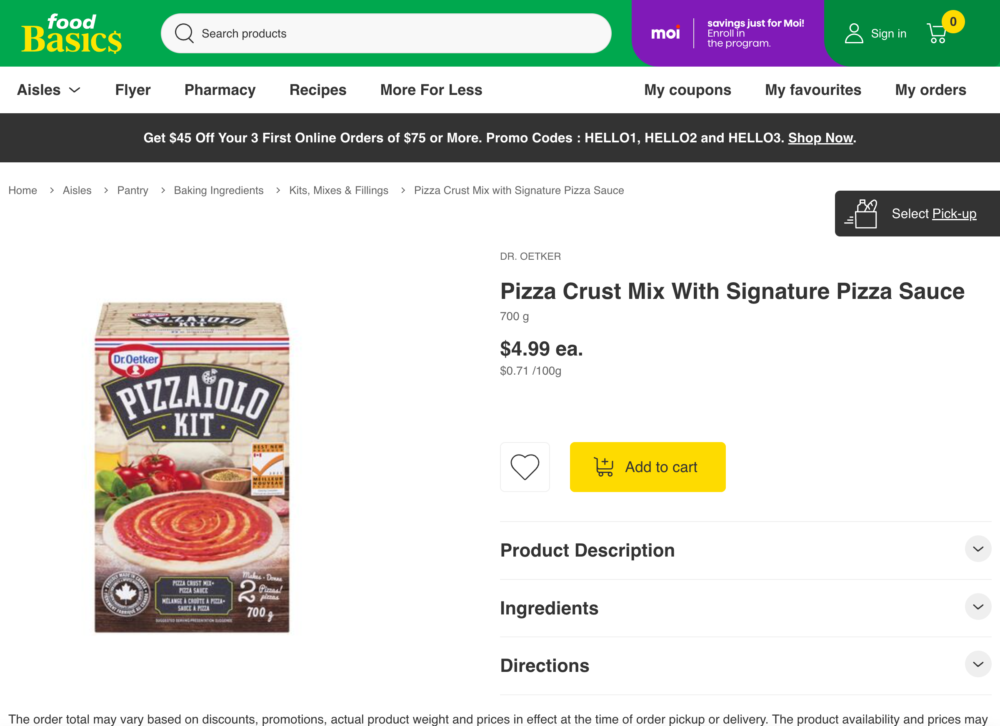

Saved item {'name': 'Pizza Crust Mix With Signature Pizza Sauce', 'quantity': 700.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.0071285714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/kits-mixes-fillings/pizza-crust-mix-with-signature-pizza-sauce/p/058336050107', 'createdAt': '2025-02-02T23:36:06.779Z', 'reference_item_id': 41, 'screenshot': './screenshots/41_Pizza Crust_2025-02-02_18-36-14.png'}
🏃 2/23 :42 - Marshmallows
get items for Marshmallows
Getting cheapest of len(items) item(s):
{'name': 'Original Marshmallow Cookies, Wagon Wheels', 'quantity': 315.0, 'unitOfMeasure': 'g', 'price': 1.98, 'pricePerWeight': 0.006285714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/cookies-cakes/original-marshmallow-cookies/p/063348165442', 'createdAt': '2025-02-02T23:36:29.722Z', 'reference_item_id': 42}


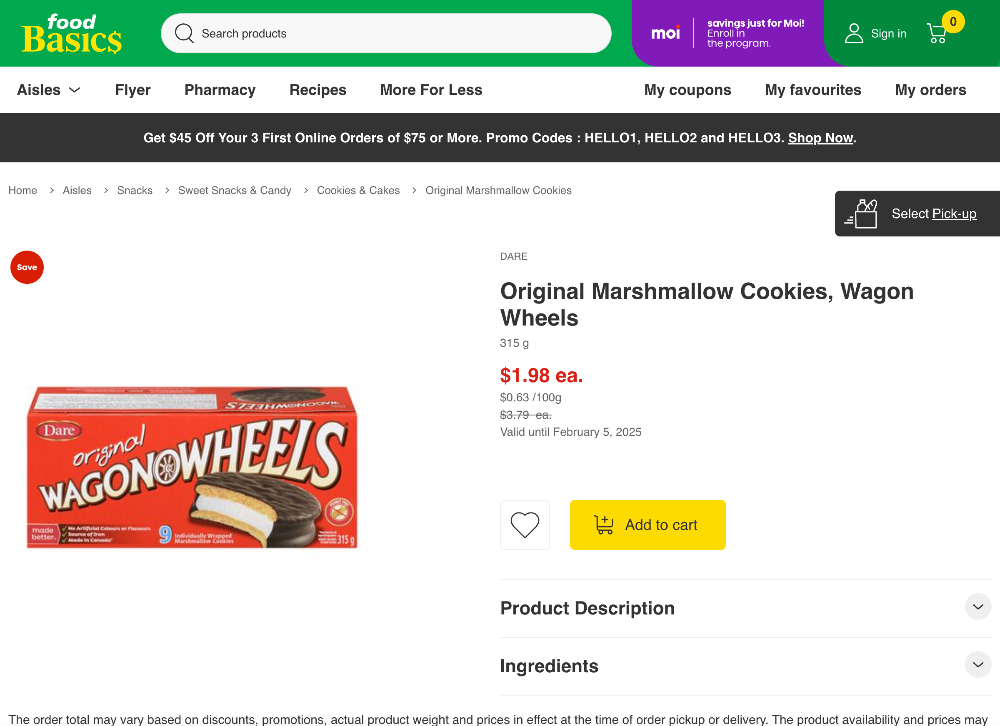

Saved item {'name': 'Original Marshmallow Cookies, Wagon Wheels', 'quantity': 315.0, 'unitOfMeasure': 'g', 'price': 1.98, 'pricePerWeight': 0.006285714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/cookies-cakes/original-marshmallow-cookies/p/063348165442', 'createdAt': '2025-02-02T23:36:29.722Z', 'reference_item_id': 42, 'screenshot': './screenshots/42_Marshmallows_2025-02-02_18-36-37.png'}
🏃 3/23 :43 - Vegetable Oil
get items for Vegetable Oil
Getting cheapest of len(items) item(s):
{'name': 'Vegetable Oil', 'quantity': 946.0, 'unitOfMeasure': 'mL', 'price': 4.99, 'pricePerWeight': 0.005274841437632135, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/oils-vinegars/vegetable-oil/vegetable-oil/p/059749888790', 'createdAt': '2025-02-02T23:36:55.466Z', 'reference_item_id': 43}


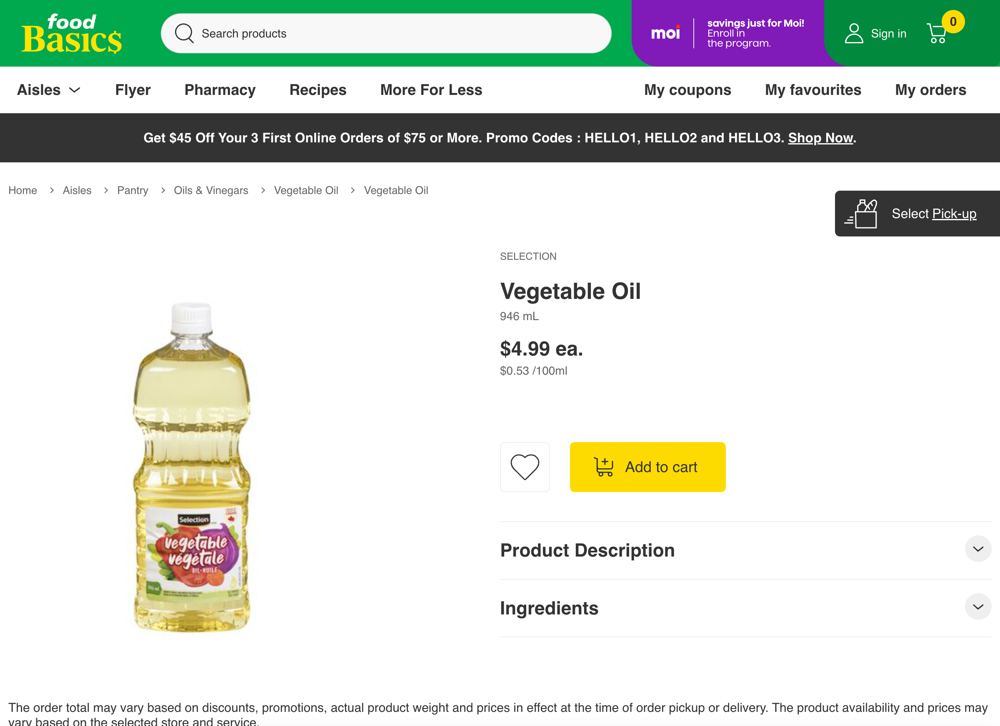

Saved item {'name': 'Vegetable Oil', 'quantity': 946.0, 'unitOfMeasure': 'mL', 'price': 4.99, 'pricePerWeight': 0.005274841437632135, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/oils-vinegars/vegetable-oil/vegetable-oil/p/059749888790', 'createdAt': '2025-02-02T23:36:55.466Z', 'reference_item_id': 43, 'screenshot': './screenshots/43_Vegetable Oil_2025-02-02_18-37-03.png'}
🏃 4/23 :44 - Granulated Sugar
get items for Granulated Sugar
Getting cheapest of len(items) item(s):
{'name': 'No Calorie Granulated Sweetener', 'quantity': 275.0, 'unitOfMeasure': 'g', 'price': 10.49, 'pricePerWeight': 0.038145454545454545, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/sugar-sweeteners/no-calorie-granulated-sweetener/p/722776210116', 'createdAt': '2025-02-02T23:37:19.428Z', 'reference_item_id': 44}


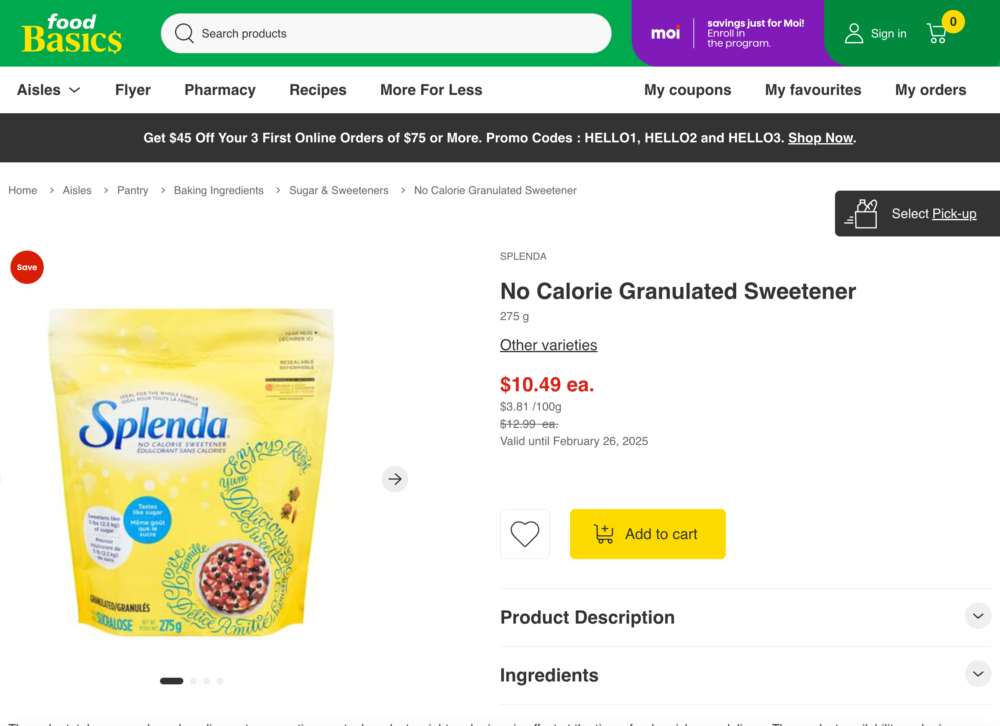

Saved item {'name': 'No Calorie Granulated Sweetener', 'quantity': 275.0, 'unitOfMeasure': 'g', 'price': 10.49, 'pricePerWeight': 0.038145454545454545, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/sugar-sweeteners/no-calorie-granulated-sweetener/p/722776210116', 'createdAt': '2025-02-02T23:37:19.428Z', 'reference_item_id': 44, 'screenshot': './screenshots/44_Granulated Sugar_2025-02-02_18-37-27.png'}
🏃 5/23 :45 - Muffins
get items for Muffins
Getting cheapest of len(items) item(s):
{'name': 'Blueberry Bagel', 'quantity': 452.0, 'unitOfMeasure': 'g', 'price': 1.99, 'pricePerWeight': 0.004402654867256637, 'referenceUrl': 'https://www.foodbasics.ca/aisles/bread-bakery-products/muffins-bagels-baked-goods/bagels/blueberry-bagel/p/773889744845', 'createdAt': '2025-02-02T23:37:41.421Z', 'reference_item_id': 45}


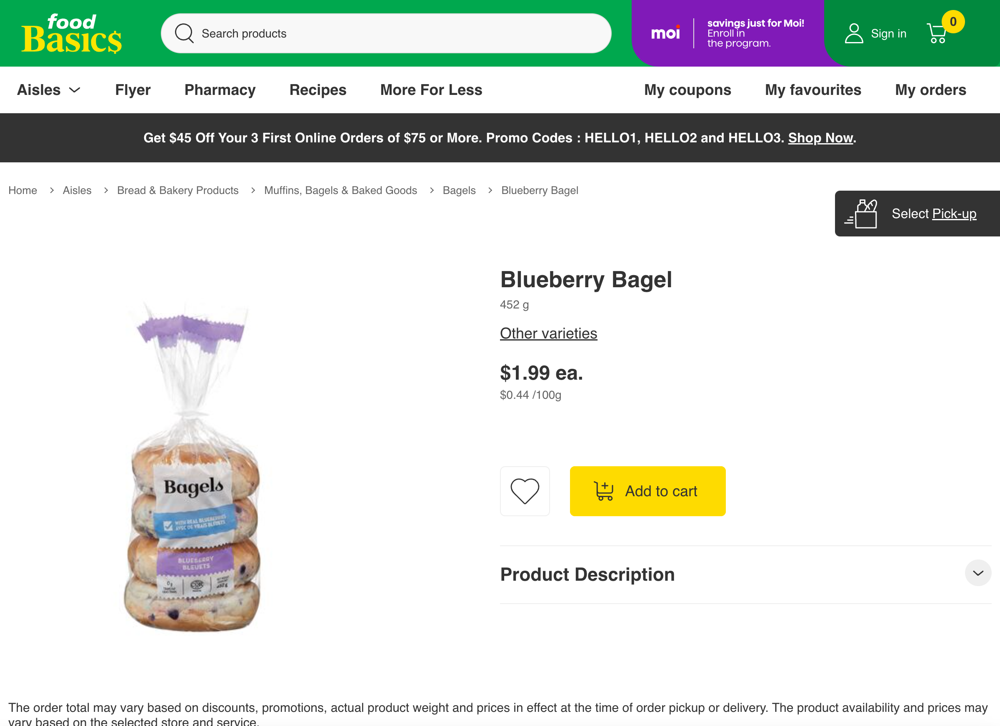

Saved item {'name': 'Blueberry Bagel', 'quantity': 452.0, 'unitOfMeasure': 'g', 'price': 1.99, 'pricePerWeight': 0.004402654867256637, 'referenceUrl': 'https://www.foodbasics.ca/aisles/bread-bakery-products/muffins-bagels-baked-goods/bagels/blueberry-bagel/p/773889744845', 'createdAt': '2025-02-02T23:37:41.421Z', 'reference_item_id': 45, 'screenshot': './screenshots/45_Muffins_2025-02-02_18-37-50.png'}
🏃 6/23 :47 - Kraft Ranch Dressing
get items for Kraft Ranch Dressing
Query https://www.foodbasics.ca/search?sortOrder=price-asc&filter=Kraft+Ranch+Dressing did not return any items!
🏃 7/23 :48 - Bulk Medjool Dates
get items for Bulk Medjool Dates
Query https://www.foodbasics.ca/search?sortOrder=price-asc&filter=Bulk+Medjool+Dates did not return any items!
🏃 8/23 :49 - Dempster's Bagels
get items for Dempster's Bagels
Could not find or remove the consent div: Message: 
Stacktrace:
0   chromedriver                        0x00000001010130d4 cxxbridge1$str$ptr + 2600792
1   chromedriver     

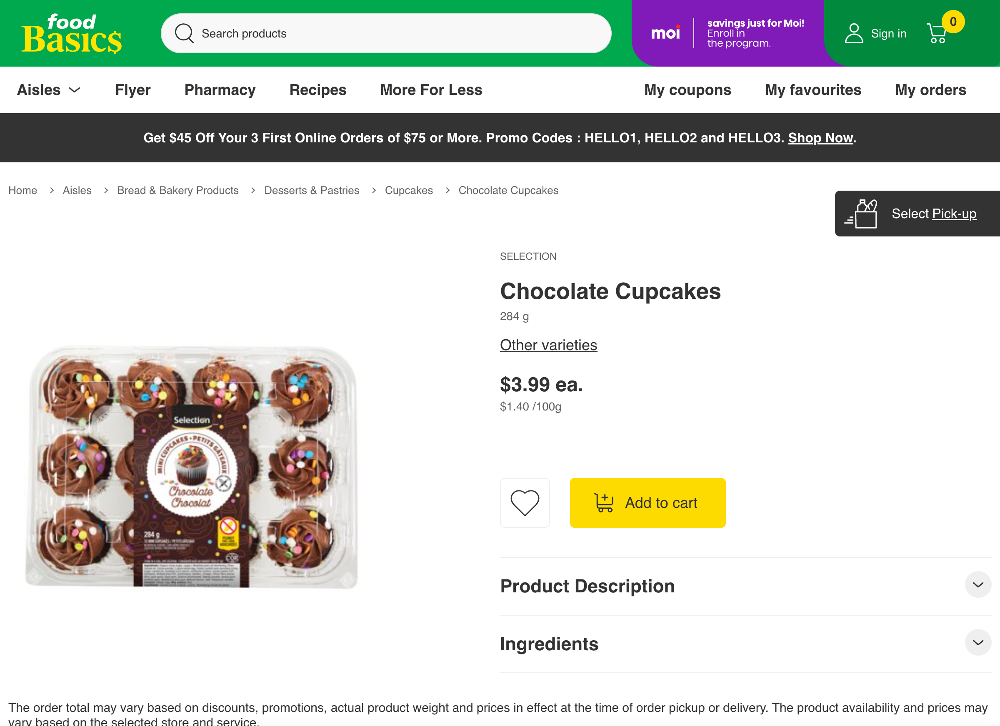

Saved item {'name': 'Chocolate Cupcakes', 'quantity': 284.0, 'unitOfMeasure': 'g', 'price': 3.99, 'pricePerWeight': 0.014049295774647887, 'referenceUrl': 'https://www.foodbasics.ca/aisles/bread-bakery-products/desserts-pastries/cupcakes/chocolate-cupcakes/p/059749971461', 'createdAt': '2025-02-02T23:39:49.005Z', 'reference_item_id': 52, 'screenshot': './screenshots/52_Cupcakes_2025-02-02_18-39-57.png'}
🏃 12/23 :53 - Frozen Apple Pie
get items for Frozen Apple Pie
Getting cheapest of len(items) item(s):
{'name': 'Frozen Phyllo Pastry', 'quantity': 454.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.010991189427312776, 'referenceUrl': 'https://www.foodbasics.ca/aisles/frozen/bakery/pie-shells-dough/frozen-phyllo-pastry/p/059749896290', 'createdAt': '2025-02-02T23:40:10.730Z', 'reference_item_id': 53}


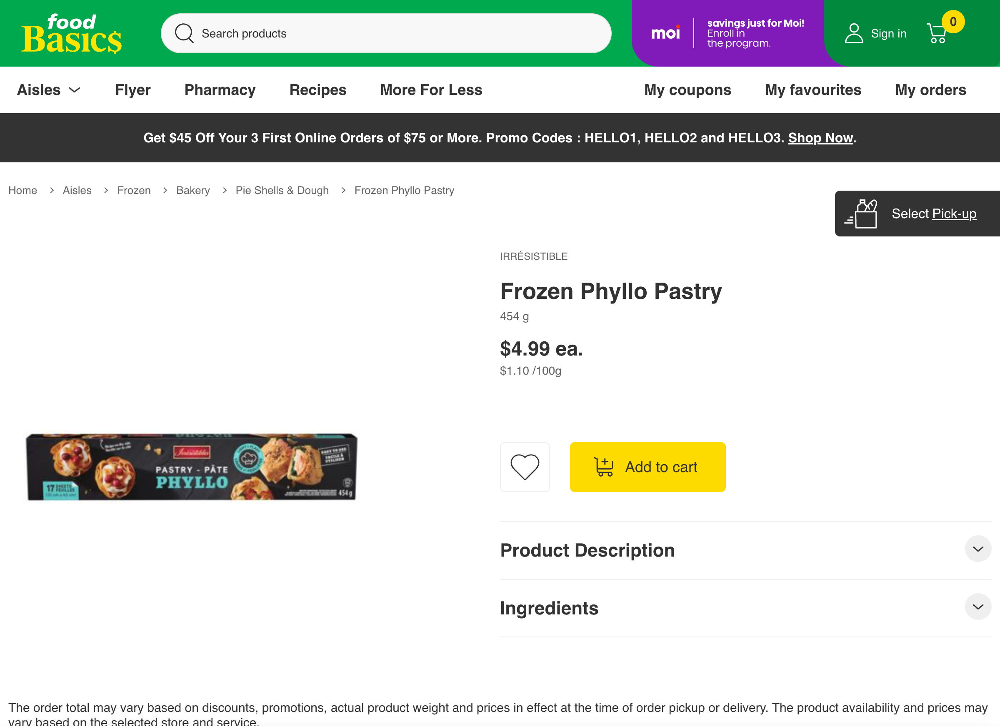

Saved item {'name': 'Frozen Phyllo Pastry', 'quantity': 454.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.010991189427312776, 'referenceUrl': 'https://www.foodbasics.ca/aisles/frozen/bakery/pie-shells-dough/frozen-phyllo-pastry/p/059749896290', 'createdAt': '2025-02-02T23:40:10.730Z', 'reference_item_id': 53, 'screenshot': './screenshots/53_Frozen Apple Pie_2025-02-02_18-40-19.png'}
🏃 13/23 :54 - Maple Leaf Seasoned Chicken
get items for Maple Leaf Seasoned Chicken
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   c

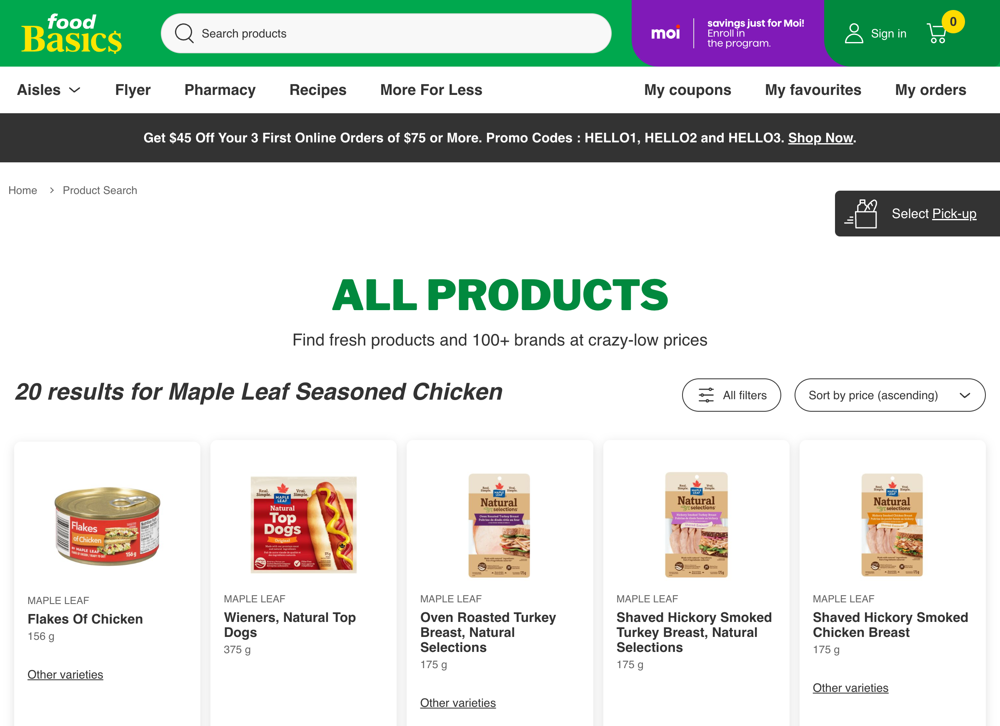

Saved 6 item(s)
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   chromedriver                        0x0000000100ddc3d8 cxxbridge1$string$len + 89376
3   chromedriver                        0x0000000100e21414 cxxbridge1$string$len + 372060
4   chromedriver                        0x0000000100e16ca4 cxxbridge1$string$len + 329196
5   chromedriver                        0x0000000100e5b638 cxxbridge1$string$len + 610176
6   chromedriver                        0x0000000100e1534c cxxbridge1$string$len + 322708
7   chromedriver        

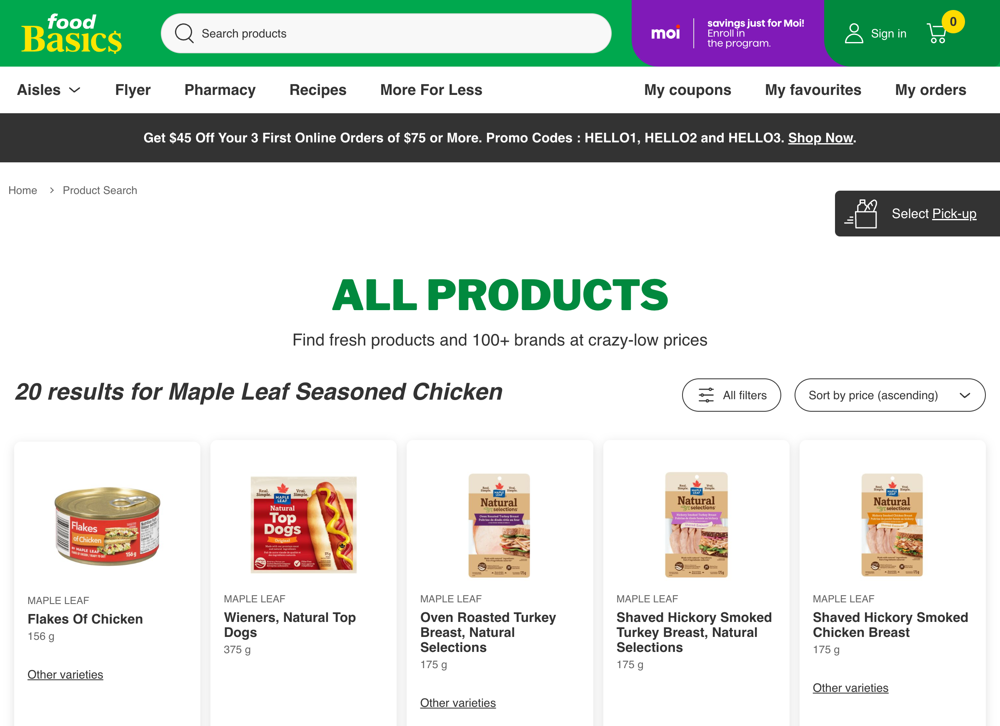

Saved 6 item(s)
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   chromedriver                        0x0000000100ddc3d8 cxxbridge1$string$len + 89376
3   chromedriver                        0x0000000100e21414 cxxbridge1$string$len + 372060
4   chromedriver                        0x0000000100e16ca4 cxxbridge1$string$len + 329196
5   chromedriver                        0x0000000100e5b638 cxxbridge1$string$len + 610176
6   chromedriver                        0x0000000100e1534c cxxbridge1$string$len + 322708
7   chromedriver        

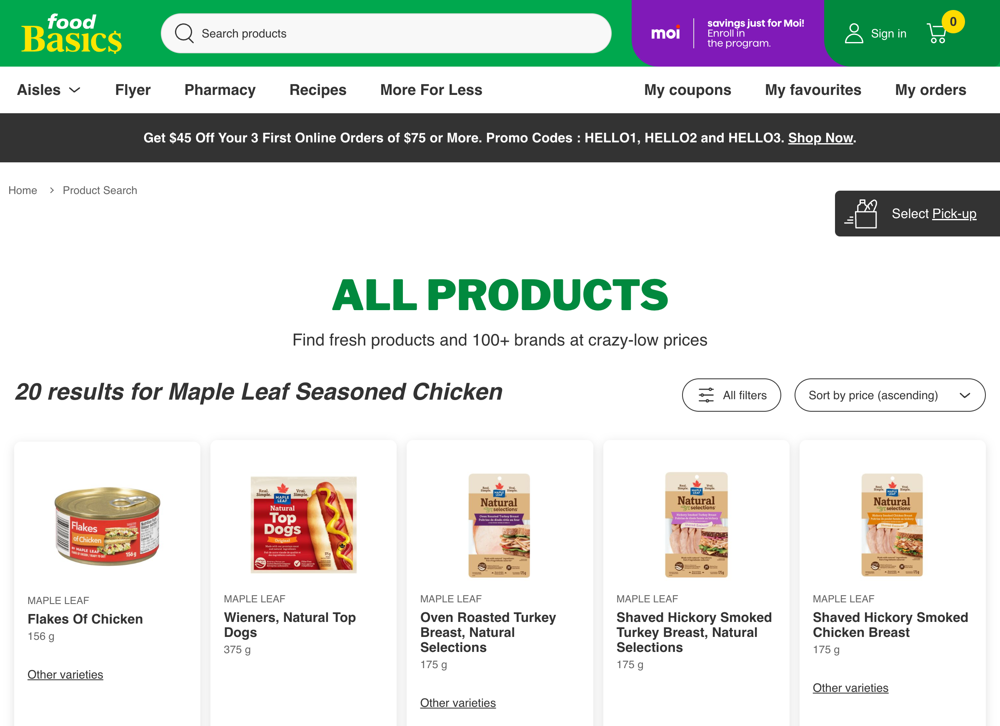

Saved 8 item(s)
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   chromedriver                        0x0000000100ddc3d8 cxxbridge1$string$len + 89376
3   chromedriver                        0x0000000100e21414 cxxbridge1$string$len + 372060
4   chromedriver                        0x0000000100e16ca4 cxxbridge1$string$len + 329196
5   chromedriver                        0x0000000100e5b638 cxxbridge1$string$len + 610176
6   chromedriver                        0x0000000100e1534c cxxbridge1$string$len + 322708
7   chromedriver        

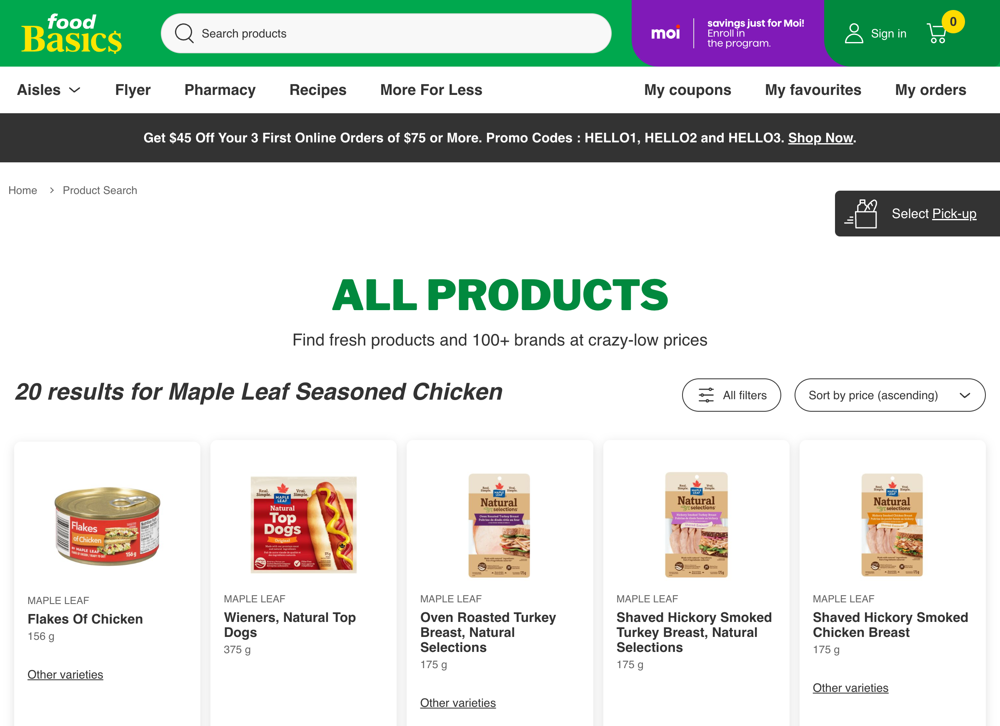

Saved 8 item(s)
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   chromedriver                        0x0000000100ddc3d8 cxxbridge1$string$len + 89376
3   chromedriver                        0x0000000100e21414 cxxbridge1$string$len + 372060
4   chromedriver                        0x0000000100e16ca4 cxxbridge1$string$len + 329196
5   chromedriver                        0x0000000100e5b638 cxxbridge1$string$len + 610176
6   chromedriver                        0x0000000100e1534c cxxbridge1$string$len + 322708
7   chromedriver        

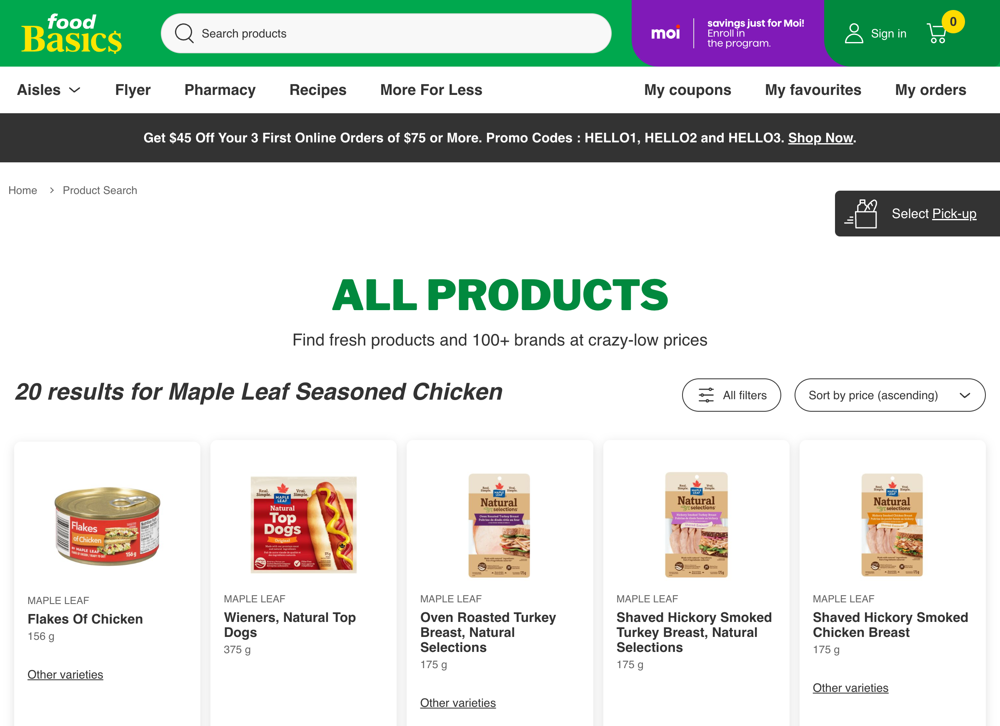

Saved 9 item(s)
Error processing product: Message: no such element: Unable to locate element: {"method":"css selector","selector":".head__unit-details"}
  (Session info: chrome=132.0.6834.160); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x00000001012430d4 cxxbridge1$str$ptr + 2600792
1   chromedriver                        0x000000010123b9f0 cxxbridge1$str$ptr + 2570356
2   chromedriver                        0x0000000100ddc3d8 cxxbridge1$string$len + 89376
3   chromedriver                        0x0000000100e21414 cxxbridge1$string$len + 372060
4   chromedriver                        0x0000000100e16ca4 cxxbridge1$string$len + 329196
5   chromedriver                        0x0000000100e5b638 cxxbridge1$string$len + 610176
6   chromedriver                        0x0000000100e1534c cxxbridge1$string$len + 322708
7   chromedriver        

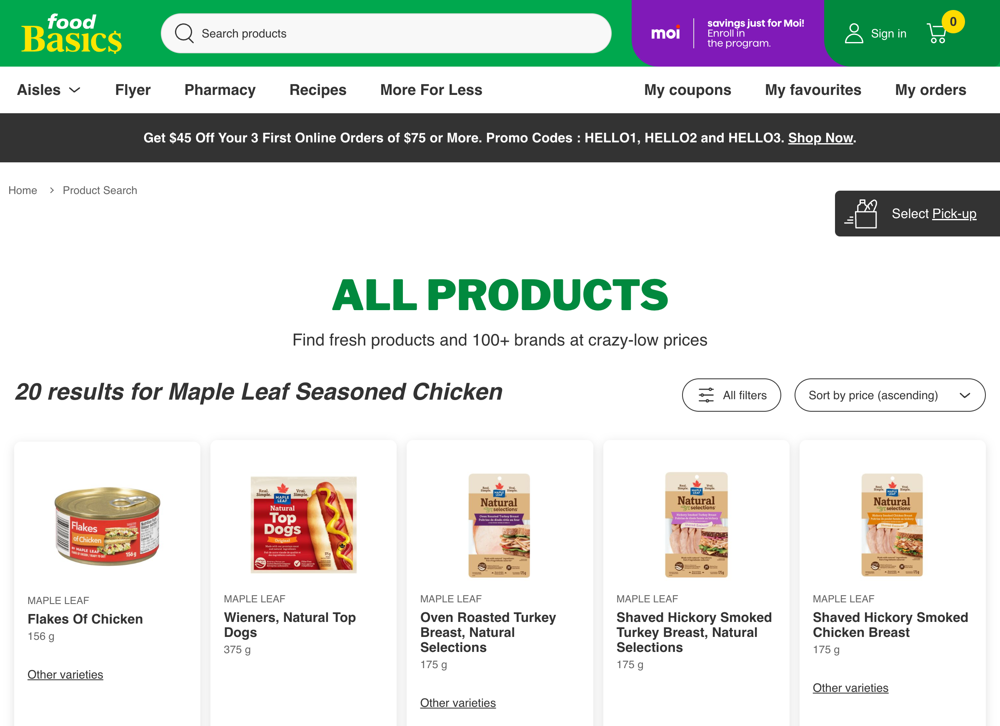

Saved 13 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Cooked Rotisserie Chicken Legs', 'quantity': 600.0, 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.01665, 'referenceUrl': 'https://www.foodbasics.ca/aisles/deli-prepared-meals/ready-meals-sides/meat-meals/cooked-rotisserie-chicken-legs/p/063100202033', 'createdAt': '2025-02-02T23:40:33.658Z', 'reference_item_id': 54}


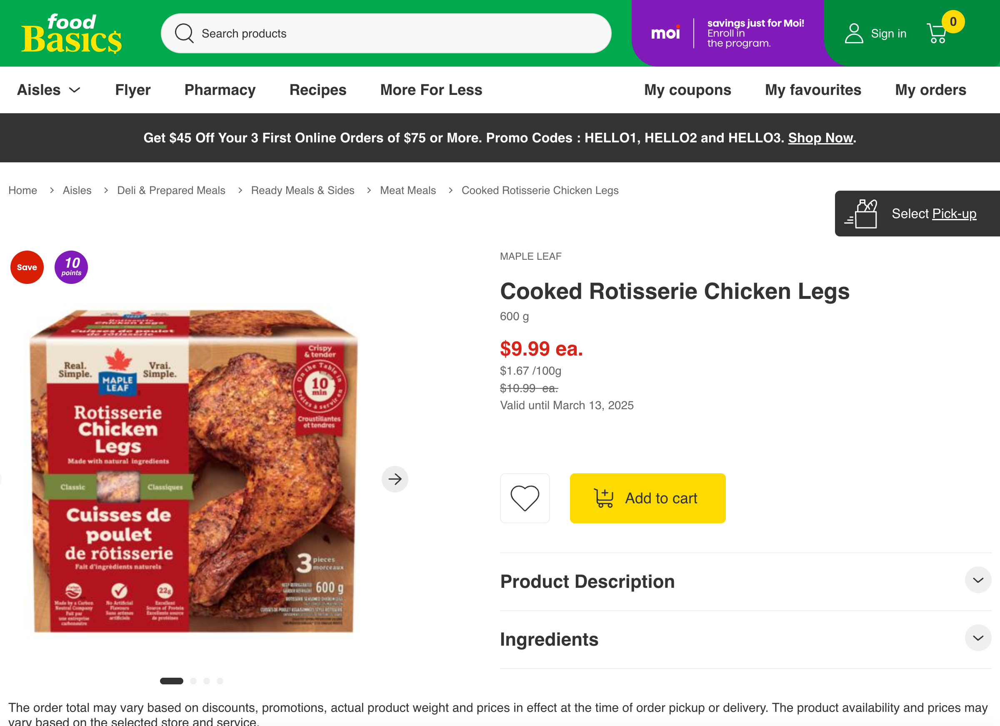

Saved item {'name': 'Cooked Rotisserie Chicken Legs', 'quantity': 600.0, 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.01665, 'referenceUrl': 'https://www.foodbasics.ca/aisles/deli-prepared-meals/ready-meals-sides/meat-meals/cooked-rotisserie-chicken-legs/p/063100202033', 'createdAt': '2025-02-02T23:40:33.658Z', 'reference_item_id': 54, 'screenshot': './screenshots/54_Maple Leaf Seasoned Chicken_2025-02-02_18-40-42.png'}
🏃 14/23 :55 - Tortillas
get items for Tortillas
Getting cheapest of len(items) item(s):
{'name': 'White Lebanese Pita', 'quantity': 330.0, 'unitOfMeasure': 'g', 'price': 1.29, 'pricePerWeight': 0.003909090909090909, 'referenceUrl': 'https://www.foodbasics.ca/aisles/bread-bakery-products/tortillas-flat-breads/pita-bread/white-lebanese-pita/p/805363000021', 'createdAt': '2025-02-02T23:40:59.294Z', 'reference_item_id': 55}


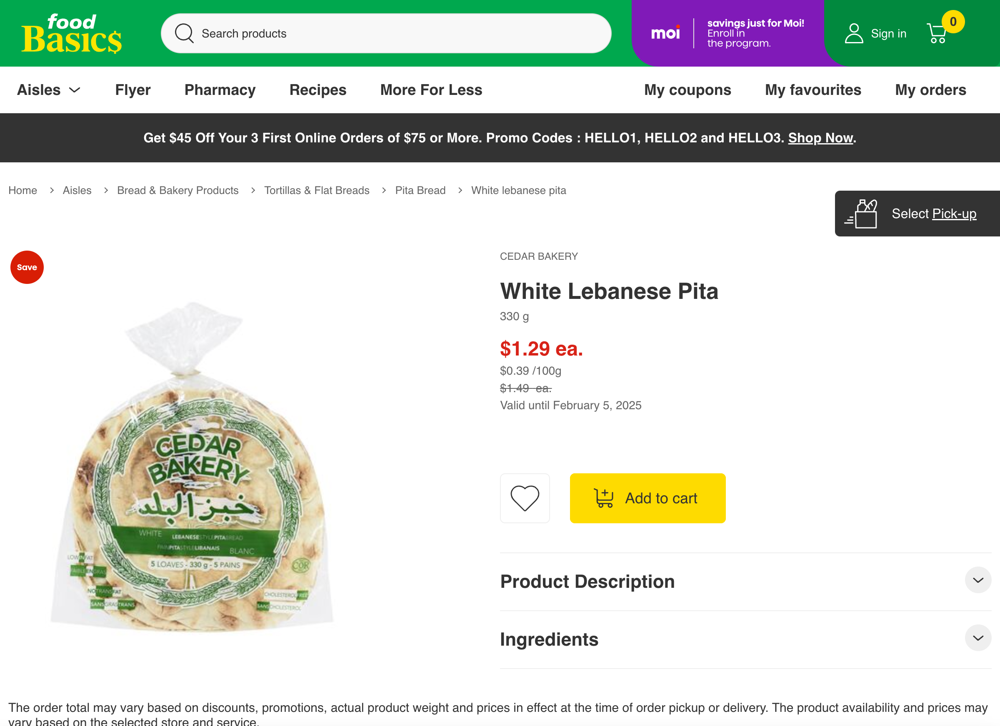

Saved item {'name': 'White Lebanese Pita', 'quantity': 330.0, 'unitOfMeasure': 'g', 'price': 1.29, 'pricePerWeight': 0.003909090909090909, 'referenceUrl': 'https://www.foodbasics.ca/aisles/bread-bakery-products/tortillas-flat-breads/pita-bread/white-lebanese-pita/p/805363000021', 'createdAt': '2025-02-02T23:40:59.294Z', 'reference_item_id': 55, 'screenshot': './screenshots/55_Tortillas_2025-02-02_18-41-07.png'}
🏃 15/23 :56 - Frozen Poutine
get items for Frozen Poutine
Query https://www.foodbasics.ca/search?sortOrder=price-asc&filter=Frozen+Poutine did not return any items!


KeyboardInterrupt: 

In [152]:
import time
import random

# Run the list
for index, proof_id in enumerate(missing_proofs):
    row = df_mapping[df_mapping['id'] == proof_id].iloc[0]
    print(f"🏃 {index+1}/{len(missing_proofs)}: {row['id']} - {row['product_name']}")
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])
    time.sleep(random.uniform(5, 10))